In [24]:
import networkx as nx

In [25]:
def normalize_data(g: nx.Graph):
    g = g.to_undirected()
    g.remove_edges_from(nx.selfloop_edges(g))
    gcc = sorted(nx.connected_components(g), key=len, reverse=True)
    g = g.subgraph(gcc[0])
    g = nx.convert_node_labels_to_integers(g, first_label=0)

    return g

In [26]:
import matplotlib.pyplot as plt

def plot_large(g: nx.Graph, title = ""):
    pos = nx.spring_layout(g, scale=2, seed=42)

    plt.figure(figsize=(20, 20), dpi=150, facecolor='white')
    nx.draw_networkx_nodes(g, pos, node_size=50, node_color='skyblue')
    nx.draw_networkx_edges(g, pos, alpha=0.5, width=0.5)
    nx.draw_networkx_labels(g, pos, font_size=8, font_color='black')
    plt.axis('off')
    plt.tight_layout()

    if title:
        plt.title(title, fontsize=14, color='blue', loc='center')
    plt.show()

# Jazz

Loading data from ./data/raw/jazz.txt

In [27]:
G_jazz = nx.read_adjlist('data/raw/jazz.txt', nodetype=int)
G_jazz = normalize_data(G_jazz)

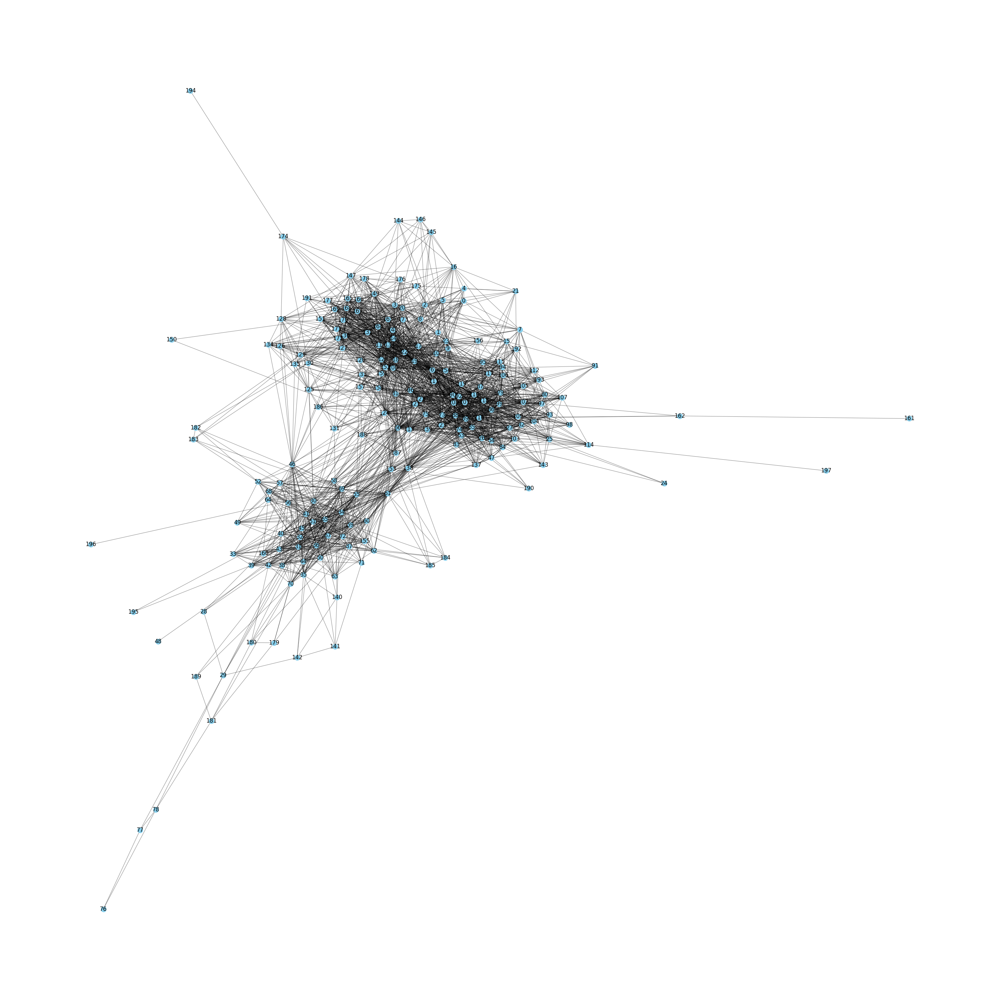

In [28]:
plot_large(G_jazz)

In [29]:
communities_fastgreedy = nx.community.greedy_modularity_communities(G_jazz)

In [30]:
modularity_fastgreedy = nx.community.modularity(G_jazz,communities_fastgreedy)
print(f'Fastgreedy = {modularity_fastgreedy:.2f}')

Fastgreedy = 0.44


In [31]:
communities_louvain = nx.community.louvain_communities(G_jazz, seed=42)

In [32]:
modularity_louvain = nx.community.modularity(G_jazz,communities_louvain)
print(f'Louvain = {modularity_louvain:.2f}')

Louvain = 0.44


# LFR Benchmark graph

Creating using the following params
```python
N = 128
tau1 = 3
tau2 = 1.5
k = 16
minc = 32
maxc = 32
mu in [0.05, 0.1, 0.2, 0.4]
```

Com base na documentação oficial [NetworkX LFR Benchmark](https://networkx.org/documentation/stable/reference/generated/networkx.generators.community.LFR_benchmark_graph.html) o parâmetro $\mu$ (mu) controla a fração de interconexão entre comunidades. Ao aumentar o mu é esperado que fique cada vez mais dificil de diferenciar a comunidade, logo a modularidade tende a cair.

In [35]:
N = 128
tau1 = 3
tau2 = 1.5
k = 16
minc = 32
maxc = 32

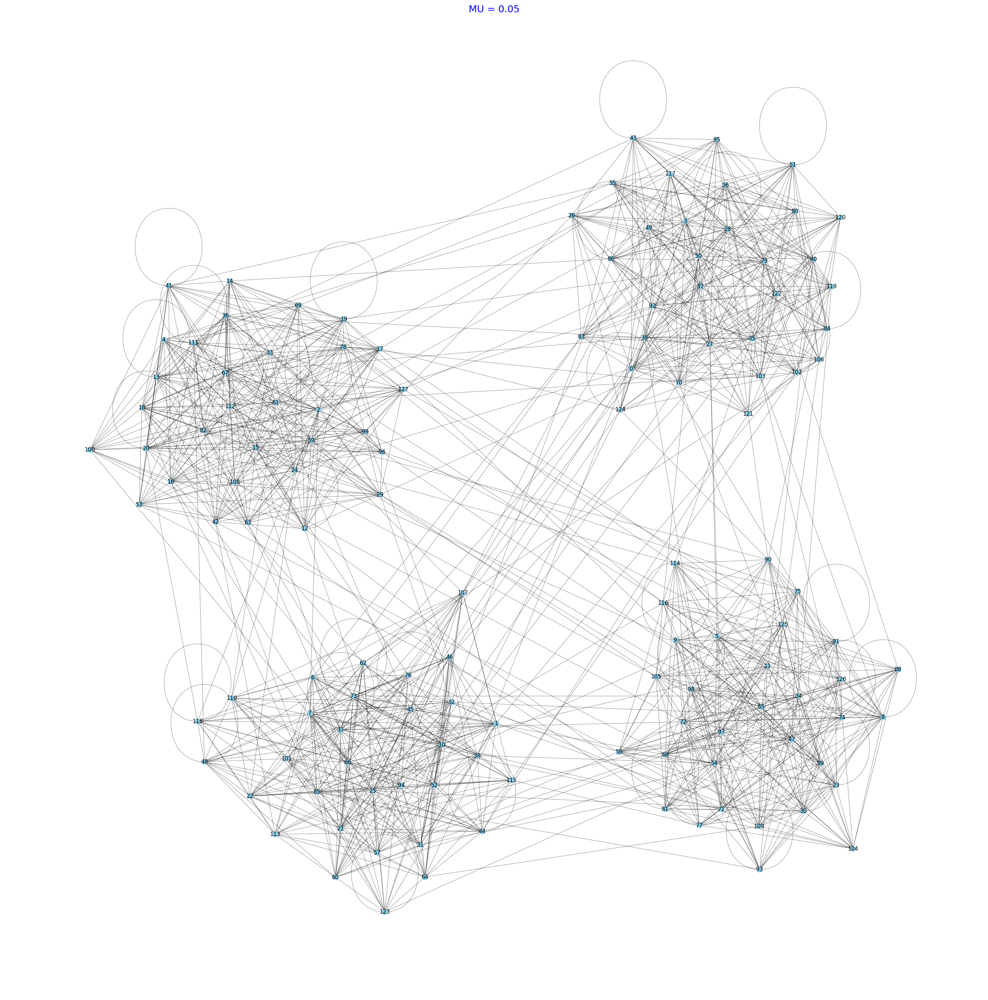

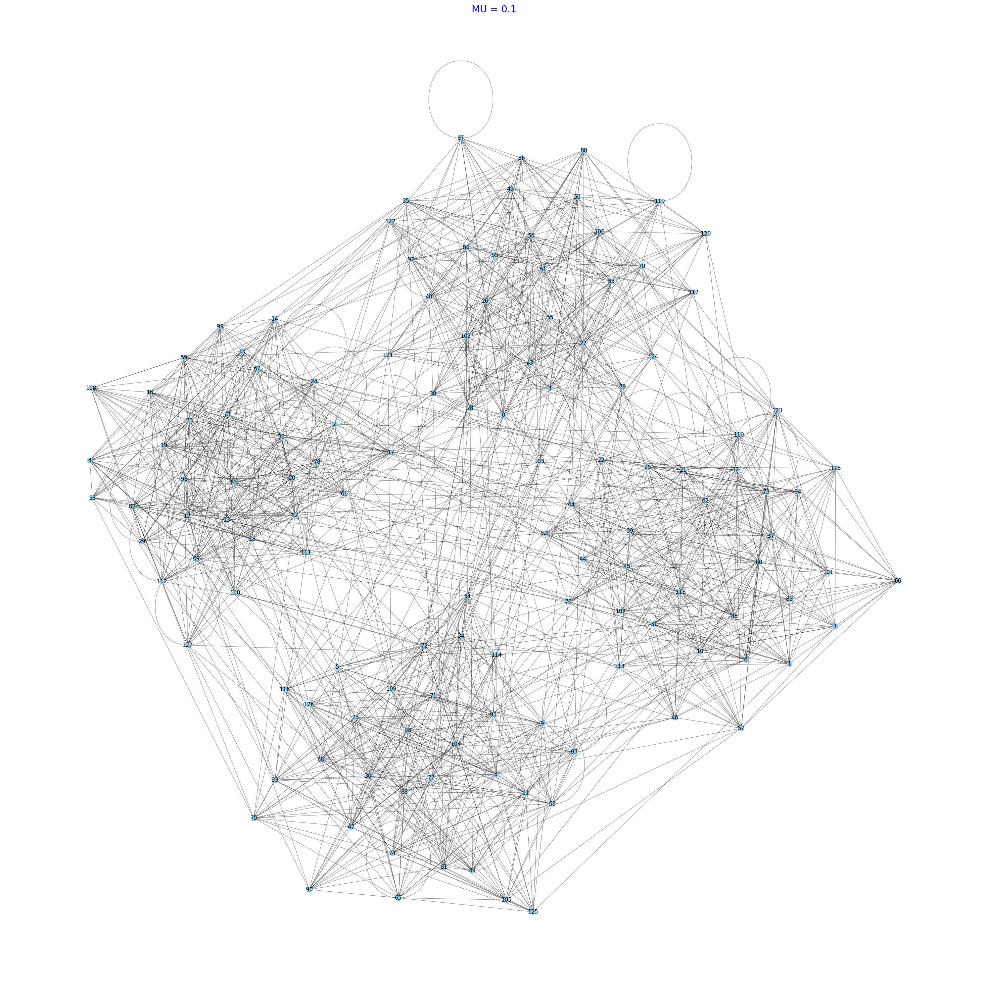

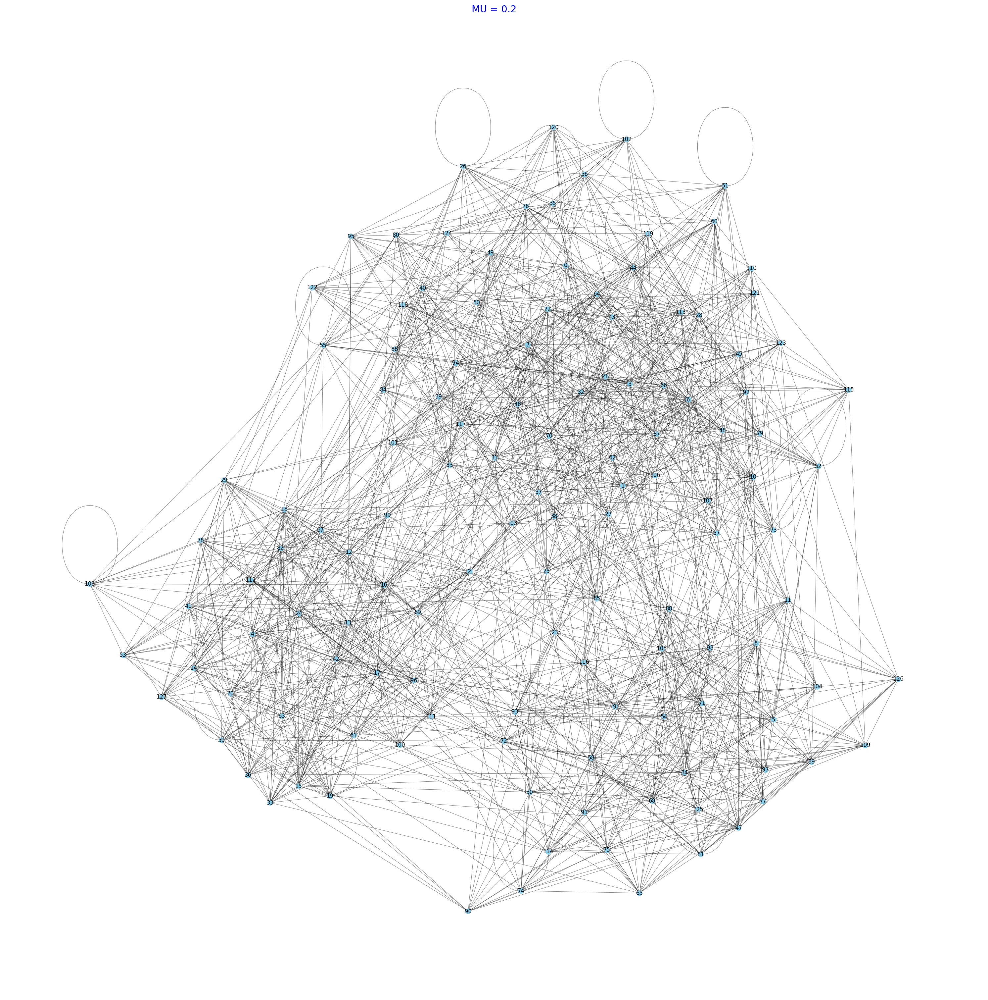

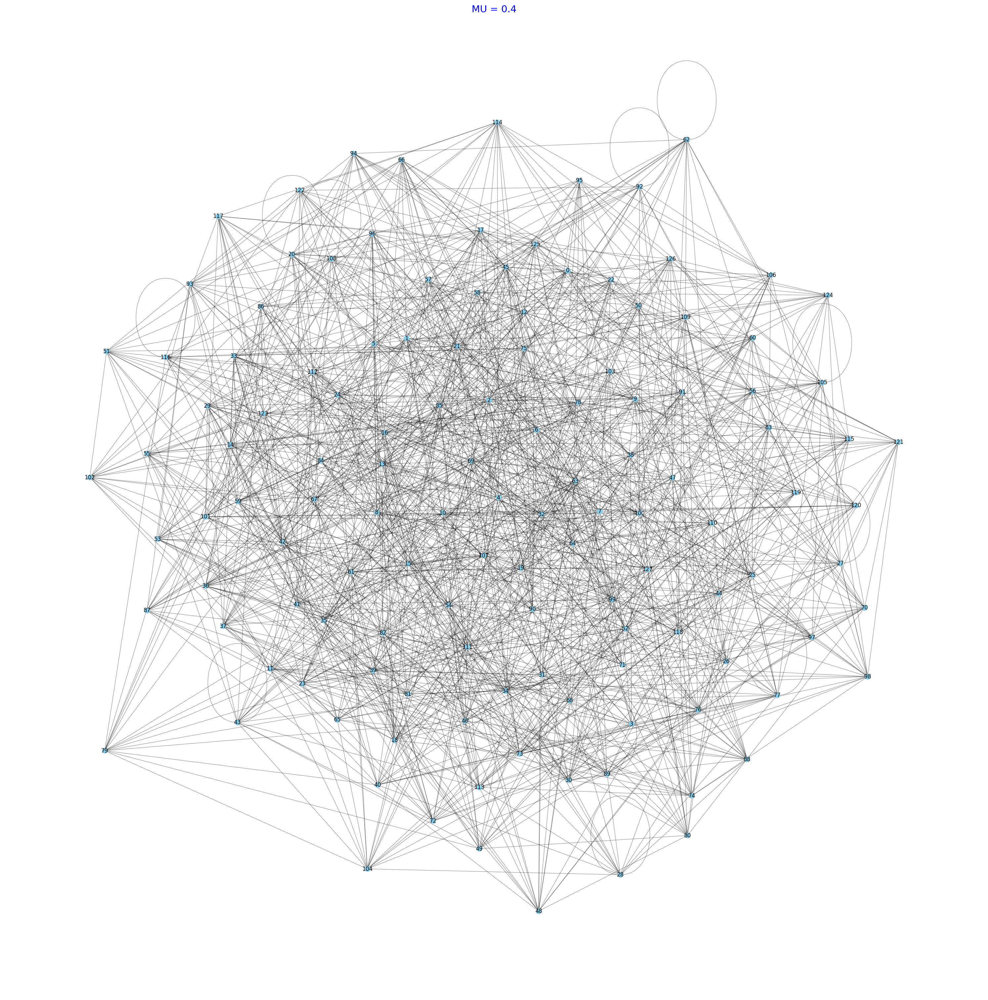

{0.05: 0.6507990505232746, 0.1: 0.549582070125871, 0.2: 0.4503933907867816, 0.4: 0.18763203187761632}


In [37]:
res = { }
for mu in [0.05, 0.1, 0.2, 0.4]:
    G = nx.LFR_benchmark_graph(
        n=N,
        tau1=tau1,
        tau2=tau2,
        mu=mu,
        min_degree=k,
        max_degree=k,
        min_community=minc,
        max_community=maxc,
        seed=10
    )

    normalize_data(G)
    plot_large(G,  f"MU = {mu}")

    communities = nx.community.louvain_communities(G, seed=42)


    Q = nx.community.modularity(G, communities)

    res[mu] = Q


print(res)

# 